In [1]:
from src.visualise import settings
from src.visualise.plot import plot_data
from src.data.paths import project_dir
from src.data.analysis import read_tiff_img, Circle, create_circular_mask
from src.data.detector import find_circle_hough_method, img_for_circle_detection

import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
import re

from dataclasses import dataclass, field
from pathlib import Path

from copy import deepcopy

# Data structures

In [2]:
@dataclass(frozen=True)
class DetectorImage:
    image: np.ndarray
    path: Path

    @property
    def init_circle(self) -> Circle:
        return Circle(x=self.image.shape[0]//2, y=self.image.shape[1]//2, r=100)

@dataclass(frozen=True)
class DetectorData:
    raw: DetectorImage
    lv: DetectorImage
    det_no: int
    circle: Circle = field(default=Circle())

@dataclass(frozen=True)
class DetectorDataCollection:
    path: Path
    data: dict[int, DetectorData] = field(default_factory=dict)

    def __post_init__(self):
        if not self.data:
            self._load_data()

    def _load_data(self):
        for file_path in sorted(self.path.iterdir()):
            if file_path.name.endswith('lv'):
                # get detector data
                det_id = re.findall(r'\d+', file_path.name)[0]
                det_no = int(det_id)
                # live view images
                lv_path = next(file_path.glob('**/*tif'))
                lv_data = read_tiff_img(lv_path, border_px=0)
                lv_image = DetectorImage(image=lv_data, path=lv_path)
                # raw data images
                try:
                    raw_path = next((self.path / det_id).glob('**/*tif'))
                    raw_data = read_tiff_img(raw_path, border_px=0)
                    raw_image = DetectorImage(image=raw_data, path=raw_path)
                    det_data = DetectorData(raw=raw_image, lv=lv_image, det_no=det_no)
                    self.data[det_no] = det_data
                    print(f"{det_no} ", end='')
                except StopIteration:
                    print(f"missing_{det_no} ", end='')

In [3]:
#raw_path = project_dir / 'data' / 'raw' / '2024-04-22' / 'PB'
raw_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-04-22\\PB')
proton_raw_data = DetectorDataCollection(path=raw_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [4]:
#co60_path = project_dir / 'data' / 'raw' / 'Co60'
co60_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-04-22\\Co60')
co60_raw_data = DetectorDataCollection(path=co60_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [14]:
#co60_path = project_dir / 'data' / 'raw' / 'Co60'
bg_path = Path('C:\\Users\\Legion\\OneDrive - ifj.edu.pl\\Projects\\MB_foils\\2024-04-22\\tlo')
bg_raw_data = DetectorDataCollection(path=bg_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

# Proton raw data

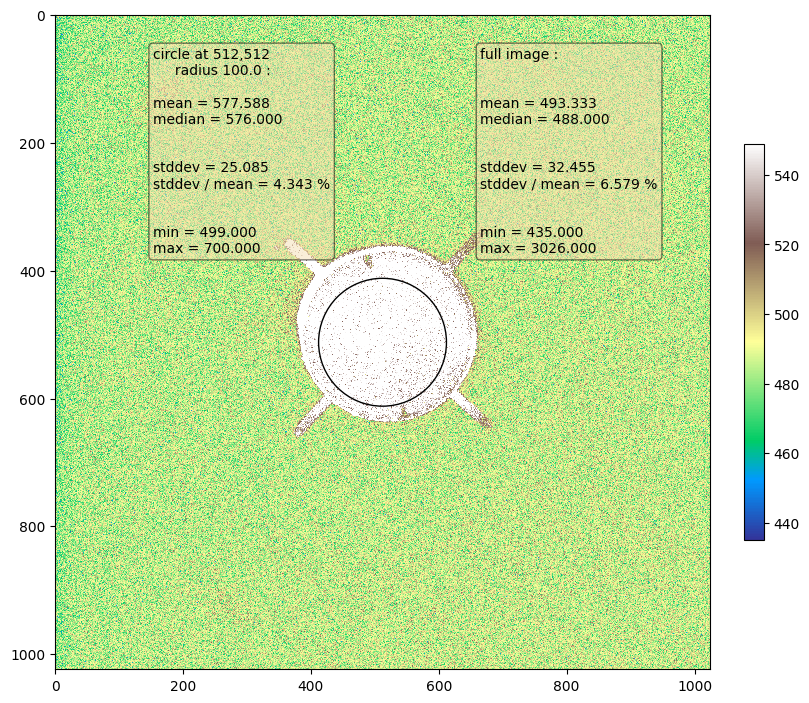

In [15]:
fig, ax = plot_data(proton_raw_data.data[1].lv.image, circle_px=proton_raw_data.data[1].lv.init_circle)

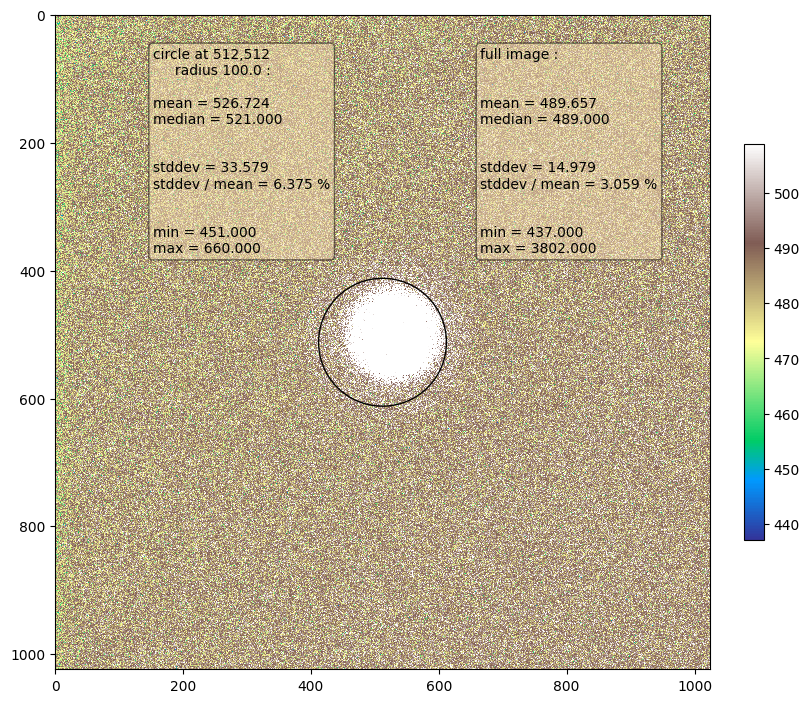

In [16]:
fig, ax = plot_data(proton_raw_data.data[1].raw.image, circle_px=proton_raw_data.data[1].raw.init_circle)

# Co60 raw data

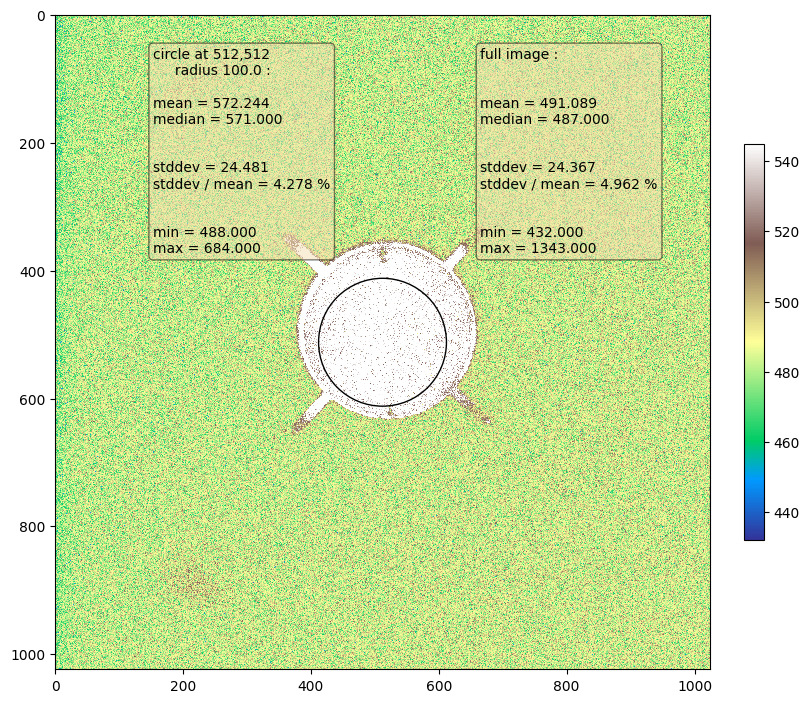

In [17]:
fig, ax = plot_data(co60_raw_data.data[1].lv.image, circle_px=co60_raw_data.data[1].lv.init_circle)

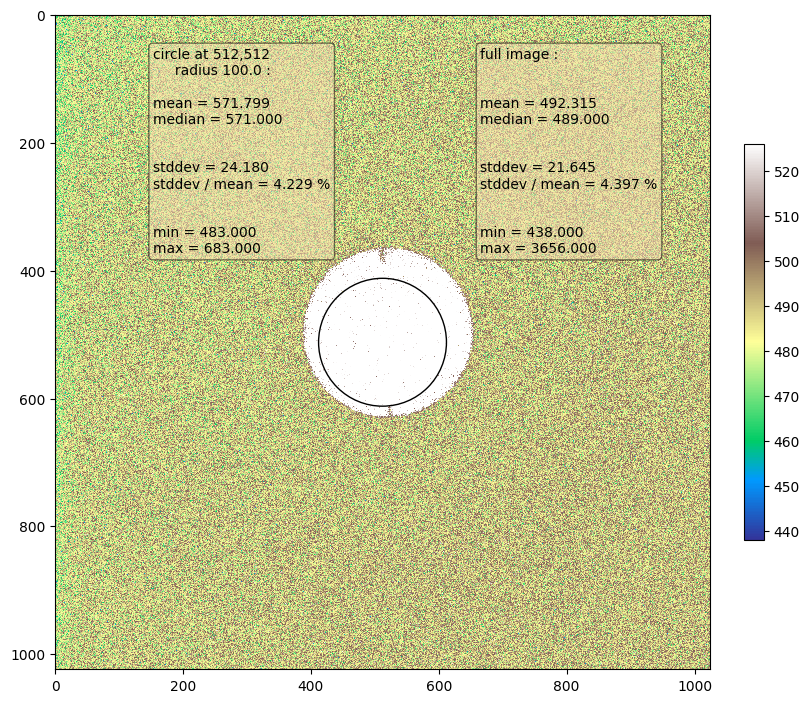

In [18]:
fig, ax = plot_data(co60_raw_data.data[1].raw.image, circle_px=co60_raw_data.data[1].raw.init_circle)

## Background

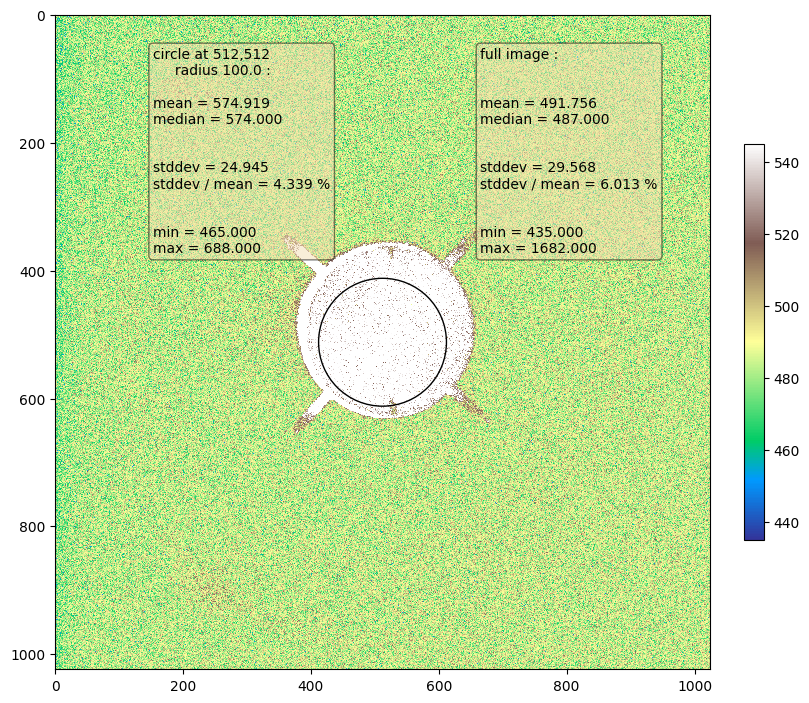

In [19]:
fig, ax = plot_data(bg_raw_data.data[1].lv.image, circle_px=bg_raw_data.data[1].lv.init_circle)

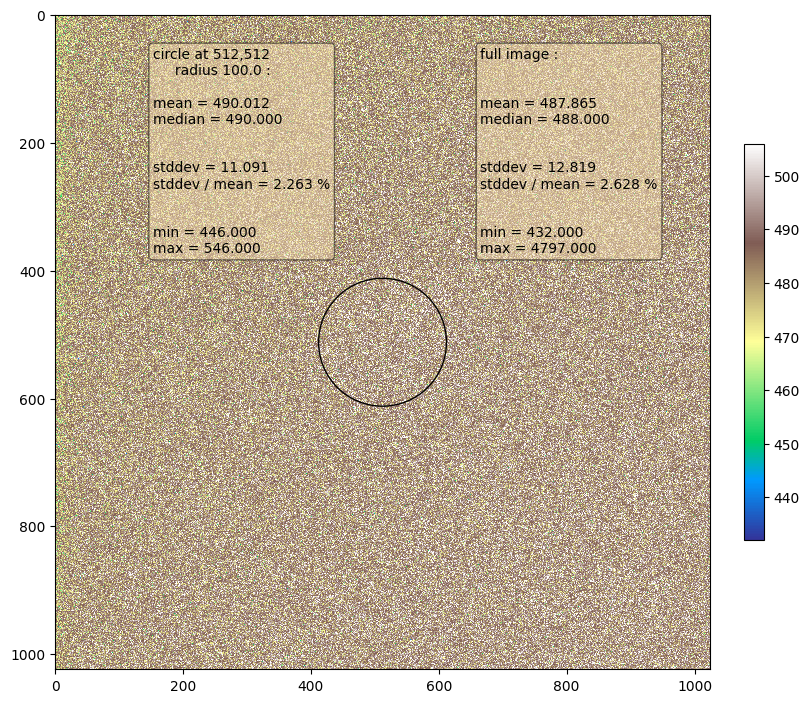

In [20]:
fig, ax = plot_data(bg_raw_data.data[1].raw.image, circle_px=bg_raw_data.data[1].raw.init_circle)

In [21]:
# background_path = next((project_dir / 'data' / 'raw' / '2024-02-20').parent.glob('**/*background*/**/**/*tif'))
# background_data = DetectorImage(path=background_path, image=read_tiff_img(background_path, border_px=0))
background_data = bg_raw_data.data[1].raw

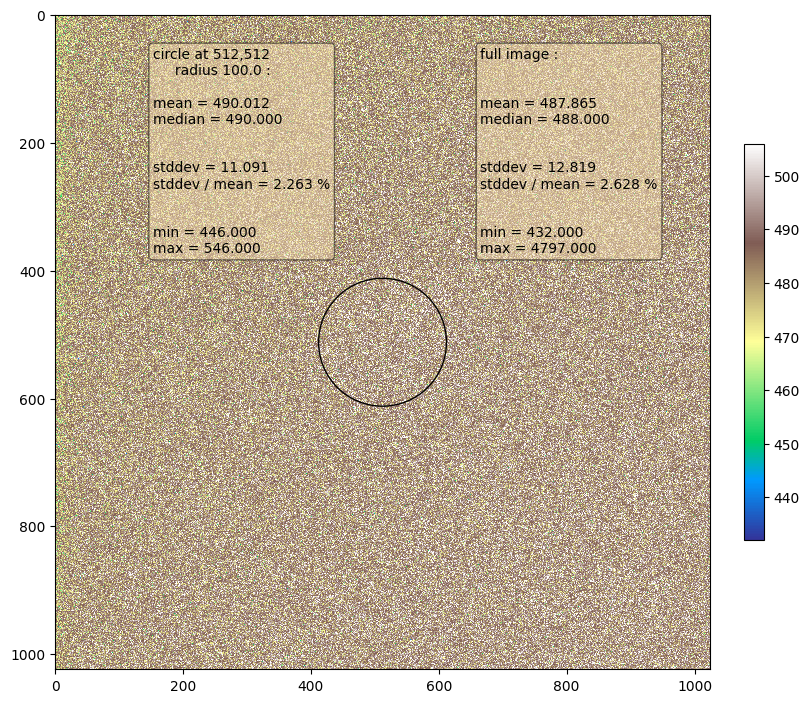

In [22]:
fig, ax = plot_data(background_data.image, circle_px=background_data.init_circle)

# Background subtraction

In [23]:
proton_bg_sub_data = DetectorDataCollection(path=proton_raw_data.path, data=deepcopy(proton_raw_data.data))
for data in proton_bg_sub_data.data.values():

    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, background_data.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, background_data.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=background_data.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, background_data.image.max(), out=data.raw.image)


In [24]:
co60_bg_sub_data = DetectorDataCollection(path=co60_raw_data.path, data=deepcopy(co60_raw_data.data))
for data in co60_bg_sub_data.data.values():

    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, background_data.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, background_data.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=background_data.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, background_data.image.max(), out=data.raw.image)

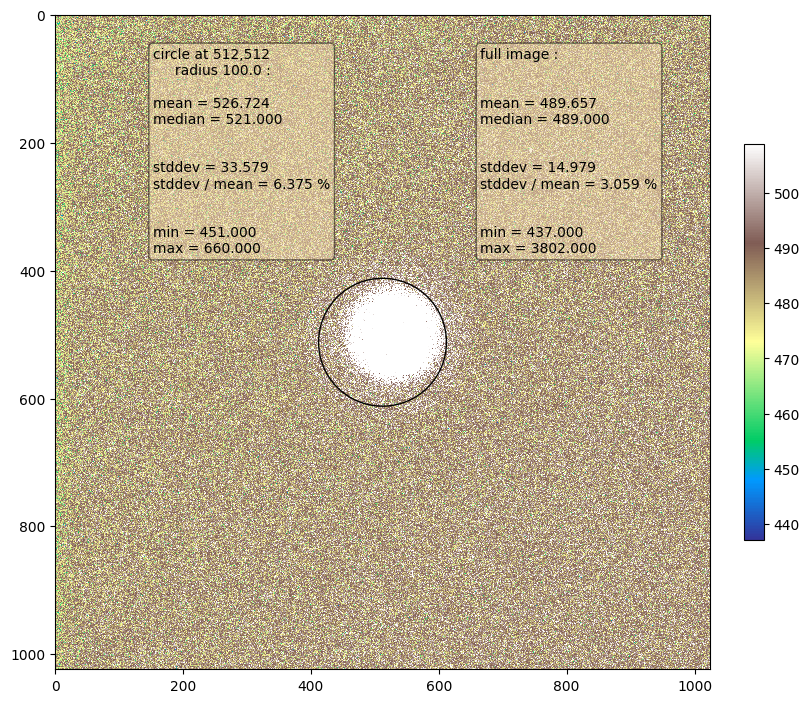

In [25]:
fig, ax = plot_data(proton_raw_data.data[1].raw.image, circle_px=proton_raw_data.data[1].raw.init_circle)

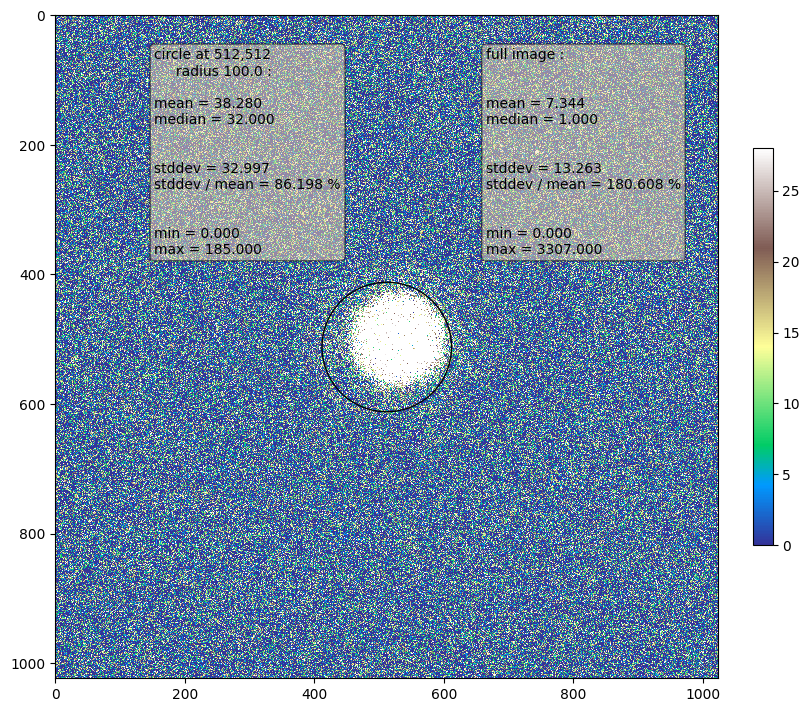

In [26]:
fig, ax = plot_data(proton_bg_sub_data.data[1].raw.image, circle_px=proton_bg_sub_data.data[1].raw.init_circle)

# Detector discovery

In [27]:
det_data_dict = {}
for data in proton_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
proton_det_data = DetectorDataCollection(path=proton_raw_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [28]:
det_data_dict = {}
for data in co60_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
co60_det_data = DetectorDataCollection(path=co60_raw_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

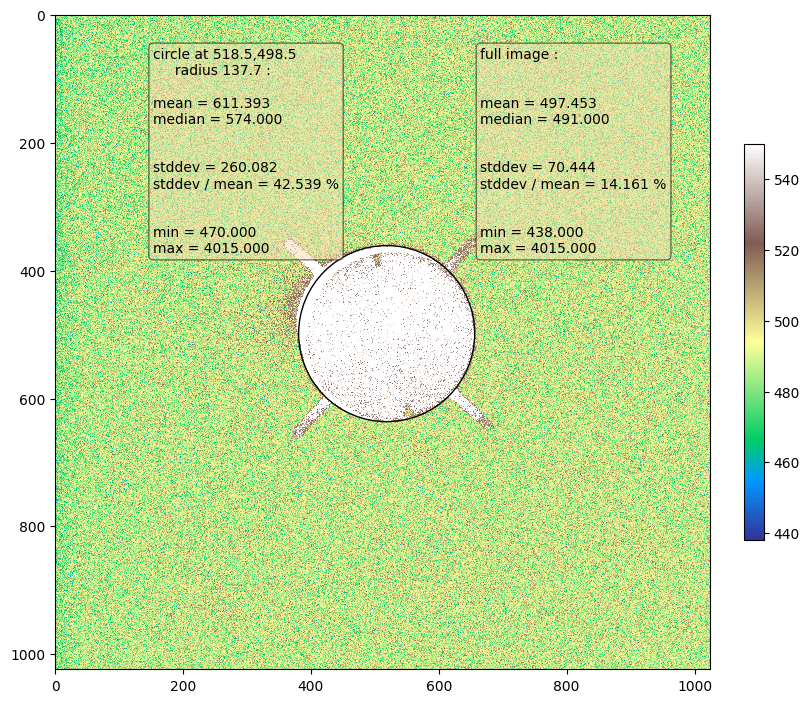

In [29]:
detid = 2 
fig, ax = plot_data(proton_det_data.data[detid].lv.image, circle_px=proton_det_data.data[detid].circle)

In [31]:
mean_radius = np.mean([data.circle.r for data in proton_det_data.data.values()])
mean_radius_mm = 10.0
px_to_mm = mean_radius_mm / mean_radius
px_to_mm

0.07211249531663806

In [32]:
px_to_mm * (323-193)

9.374624391162948

In [33]:
px_to_mm * (323-193)

9.374624391162948

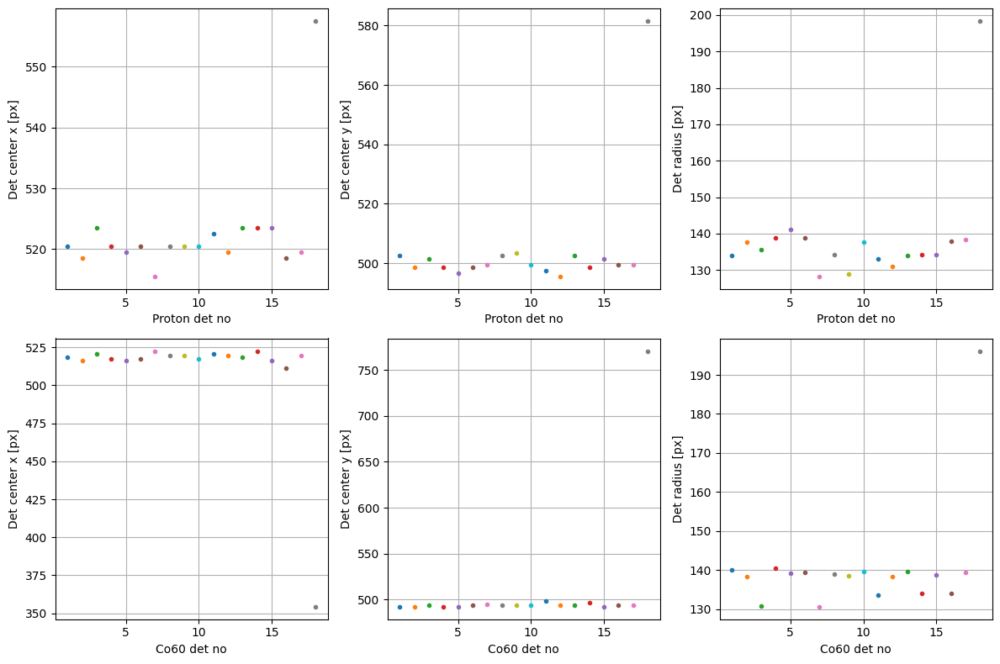

In [34]:
fig, ax = plt.subplots(2, 3, figsize=(12, 8))
for data in proton_det_data.data.values():
    ax[0, 0].plot(data.det_no, data.circle.x, '.')
    ax[0, 1].plot(data.det_no, data.circle.y, '.')
    ax[0, 2].plot(data.det_no, data.circle.r, '.')
for data in co60_det_data.data.values():
    ax[1, 0].plot(data.det_no, data.circle.x, '.')
    ax[1, 1].plot(data.det_no, data.circle.y, '.')
    ax[1, 2].plot(data.det_no, data.circle.r, '.')
for a in ax.flat:
    a.grid()
for a in ax[0]:
    a.set_xlabel('Proton det no')
for a in ax[1]:
    a.set_xlabel('Co60 det no')
for a in ax[:, 0]:
    a.set_ylabel('Det center x [px]')
for a in ax[:, 1]:
    a.set_ylabel('Det center y [px]')
for a in ax[:, 2]:
    a.set_ylabel('Det radius [px]')
fig.tight_layout()

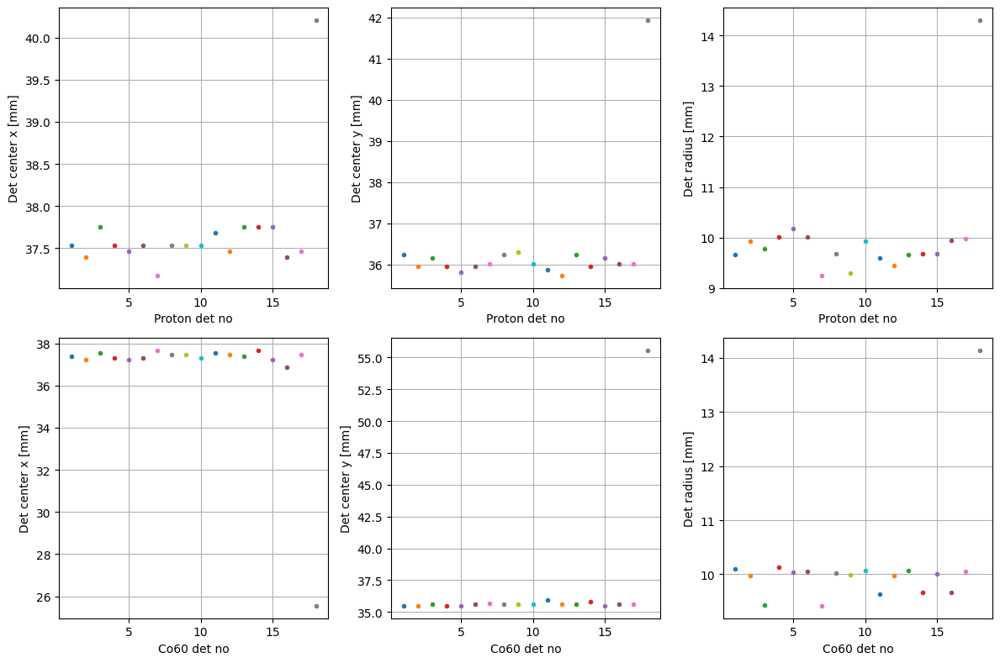

In [35]:
fig, ax = plt.subplots(2, 3, figsize=(12, 8))
for data in proton_det_data.data.values():
    ax[0, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
    ax[0, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
    ax[0, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
for data in co60_det_data.data.values():
    ax[1, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
    ax[1, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
    ax[1, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
for a in ax.flat:
    a.grid()
for a in ax[0]:
    a.set_xlabel('Proton det no')
for a in ax[1]:
    a.set_xlabel('Co60 det no')
for a in ax[:, 0]:
    a.set_ylabel('Det center x [mm]')
for a in ax[:, 1]:
    a.set_ylabel('Det center y [mm]')
for a in ax[:, 2]:
    a.set_ylabel('Det radius [mm]')
fig.tight_layout()

## Detector cutting

In [36]:
min_radius_protons = min([data.circle.r for data in proton_det_data.data.values()])
min_radius_co60 = min([data.circle.r for data in co60_det_data.data.values()])
min_radius_all = np.floor(min(min_radius_protons, min_radius_co60)).astype(int)

print(f"min radius - protons: {min_radius_protons:.2f}, Co60: {min_radius_co60:.2f}, all: {min_radius_all}")
print(f"min radius - protons: {min_radius_protons * px_to_mm:.2f} [mm], Co60: {min_radius_co60 * px_to_mm:.2f} [mm], all: {min_radius_all * px_to_mm:.2f} [mm]")

min radius - protons: 128.20, Co60: 130.70, all: 128
min radius - protons: 9.24 [mm], Co60: 9.43 [mm], all: 9.23 [mm]


In [37]:
def cut_detector(det_data: DetectorData, min_radius: int, factor: float = 1.2) -> DetectorData:
    lower_x = np.ceil(det_data.circle.x - factor*min_radius).astype(int)
    upper_x = np.floor(det_data.circle.x + factor*min_radius).astype(int)
    lower_y = np.ceil(det_data.circle.y - factor*min_radius).astype(int)
    upper_y = np.floor(det_data.circle.y + factor*min_radius).astype(int)
    
    new_circle = Circle(x=det_data.circle.x - lower_x, y=det_data.circle.y - lower_y, r=det_data.circle.r)
    cut_raw_image = det_data.raw.image[lower_y:upper_y, lower_x:upper_x][:]
    cut_lv_image = det_data.lv.image[lower_y:upper_y, lower_x:upper_x][:]

    return DetectorData(raw=DetectorImage(image=cut_raw_image, path=det_data.raw.path), lv=DetectorImage(image=cut_lv_image, path=det_data.lv.path), det_no=det_data.det_no, circle=new_circle)

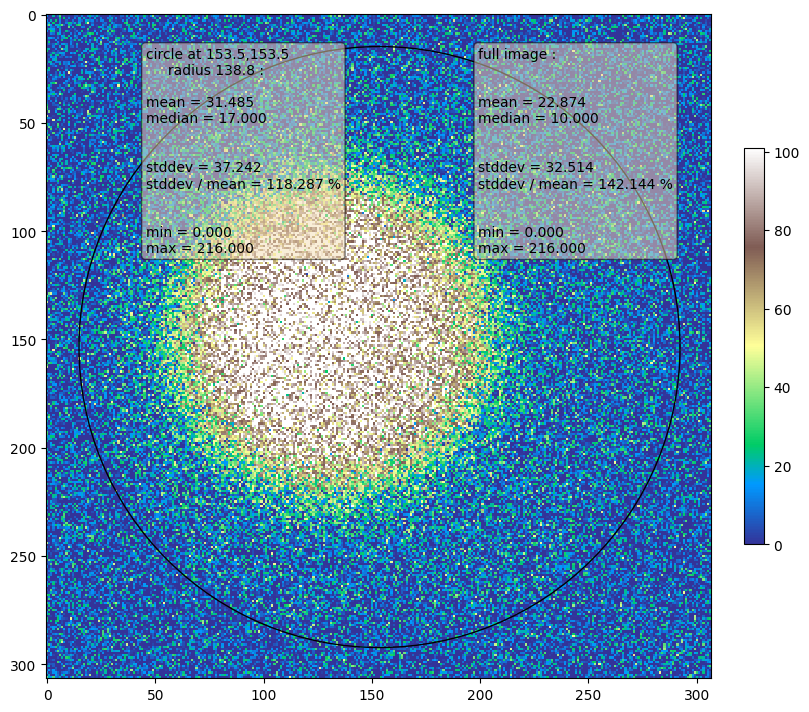

In [38]:
c1 = cut_detector(proton_det_data.data[6], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)
#c1.circle.radius * px_to_mm

In [39]:
det_data_dict = {}
for data in proton_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
proton_det_cut_data = DetectorDataCollection(path=proton_det_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [40]:
det_data_dict = {}
for data in co60_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
co60_det_cut_data = DetectorDataCollection(path=co60_det_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

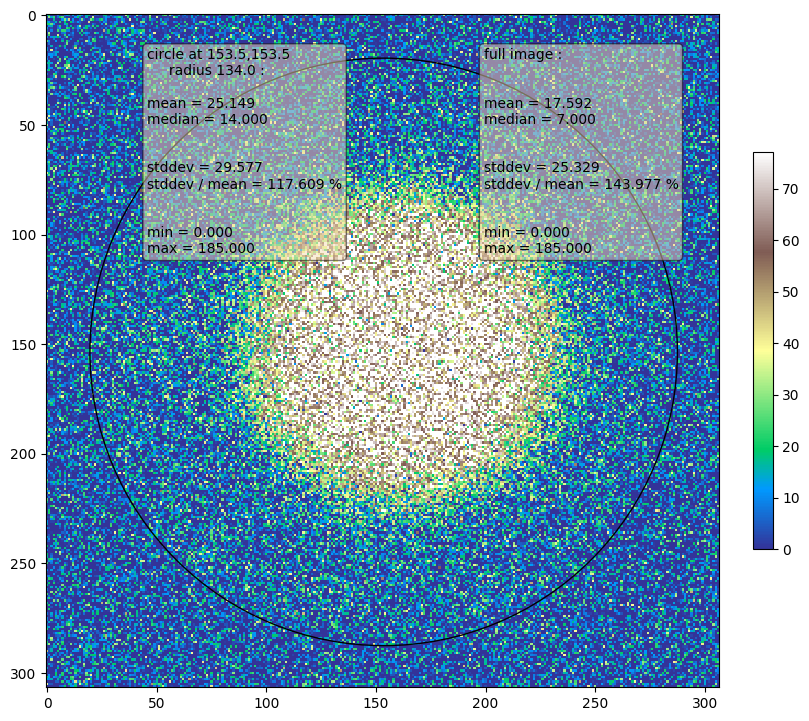

In [41]:
fig, ax = plot_data(proton_det_cut_data.data[1].raw.image, circle_px=proton_det_cut_data.data[1].circle)

# Center of mass

In [42]:
proton_det_cut_data.data[1].raw.image

array([[14, 20,  0, ...,  0,  3,  6],
       [ 0, 30, 14, ...,  0,  0,  0],
       [ 3,  0,  0, ...,  0,  6,  5],
       ...,
       [ 0,  0,  0, ...,  0, 11,  2],
       [39,  5,  4, ...,  0, 31,  0],
       [ 0,  0,  0, ..., 21,  4,  0]], dtype=uint16)

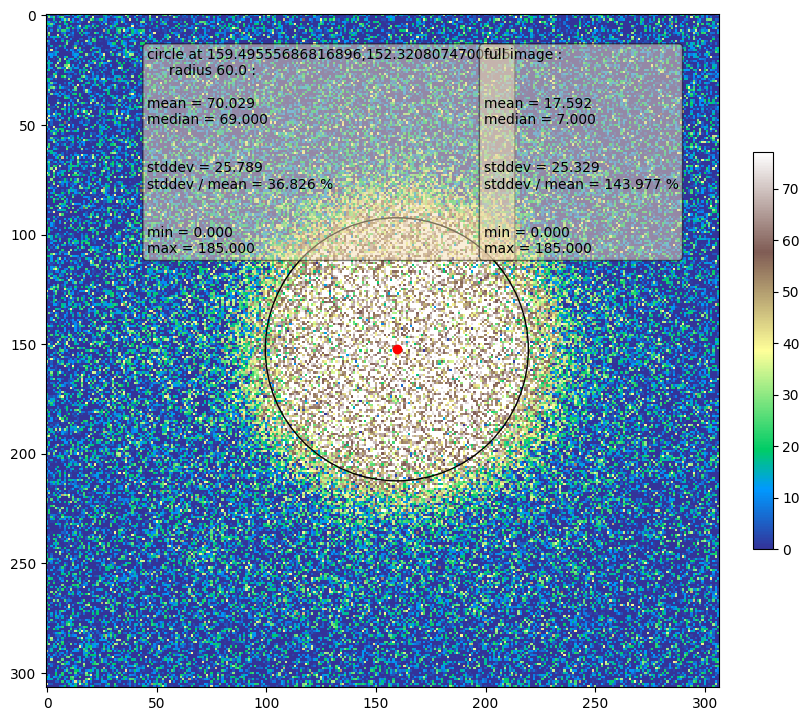

In [44]:
from scipy.ndimage import center_of_mass

def center_of_mass_det(data: DetectorData) -> tuple[float, float]:
    detector_region = deepcopy(data.raw.image)
    circle_smaller_than_det = Circle(x=data.circle.x, y=data.circle.y, r=data.circle.r * 0.95)
    mask_circle = create_circular_mask(img=detector_region, circle_px=circle_smaller_than_det)
    detector_region[~mask_circle] = 0
    cm = center_of_mass(detector_region)
    return cm

det_id = 1
cm1 = center_of_mass_det(proton_det_cut_data.data[det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=60)
fig, ax = plot_data(proton_det_cut_data.data[det_id].raw.image, circle_px=cm1_circle, clip=True)
ax.plot(cm1[1], cm1[0], 'o', color='red')

In [76]:
det_id = 1
cm1 = center_of_mass_det(proton_det_cut_data.data[det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=40)
mask = create_circular_mask(proton_det_cut_data.data[det_id].raw.image, cm1_circle)
raw_signal_counts = proton_det_cut_data.data[det_id].raw.image[mask]
factor = 4 / raw_signal_counts.mean()

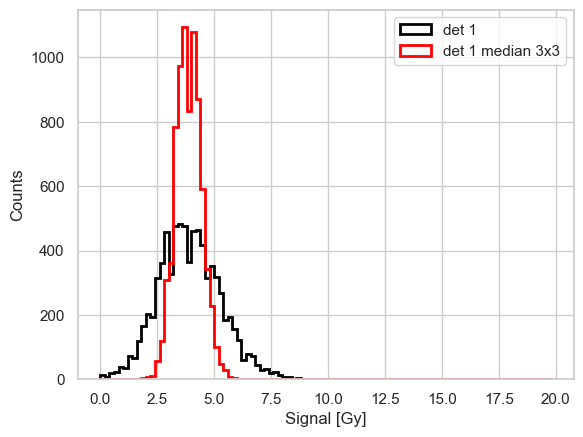

In [84]:
det_id = 1
cm1 = center_of_mass_det(proton_det_cut_data.data[det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=50)
mask = create_circular_mask(proton_det_cut_data.data[det_id].raw.image, cm1_circle)
raw_signal_counts = proton_det_cut_data.data[det_id].raw.image[mask]
raw_signal_Gy = raw_signal_counts * factor
# median filter 3x3 applied to proton_det_cut_data.data[det_id].raw.image
med3_image = ndi.median_filter(proton_det_cut_data.data[det_id].raw.image, size=3)
raw_signal_med3_Gy = med3_image[mask] * factor

fig, ax = plt.subplots()
ax.hist(raw_signal_Gy, bins=np.arange(0, 20, 0.2), histtype='step', color='black', lw=2, label=f'det {det_id}');
ax.hist(raw_signal_med3_Gy, bins=np.arange(0, 20, 0.2), histtype='step', color='red', lw=2, label=f'det {det_id} median 3x3');
ax.set_xlabel('Signal [Gy]')
ax.set_ylabel('Counts');
ax.legend()


# Mean signal inspection

In [85]:
min_radius_all
singal_radius = 0.5 * min_radius_all
singal_radius

30.0

In [86]:
from collections import defaultdict
import pandas as pd
df_data = defaultdict(list)
for data in proton_det_cut_data.data.values():
    #mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    cm = center_of_mass_det(data)
    cm_circle = Circle(x=cm[1], y=cm[0], r=60)
    mask = create_circular_mask(img=data.raw.image, circle_px=cm_circle)
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["proton"]
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["Co60"]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation
18,1,83.230552,26.125944,Co60
19,2,84.679279,27.173887,Co60
20,3,85.149222,26.809883,Co60
21,4,86.485502,27.077528,Co60
22,5,84.449788,26.252392,Co60
23,6,81.626945,26.192151,Co60
24,7,82.816124,26.139615,Co60
25,8,75.546322,27.929575,Co60
26,9,85.781825,26.554489,Co60
27,10,78.956506,26.319168,Co60


<Axes: xlabel='det_no'>

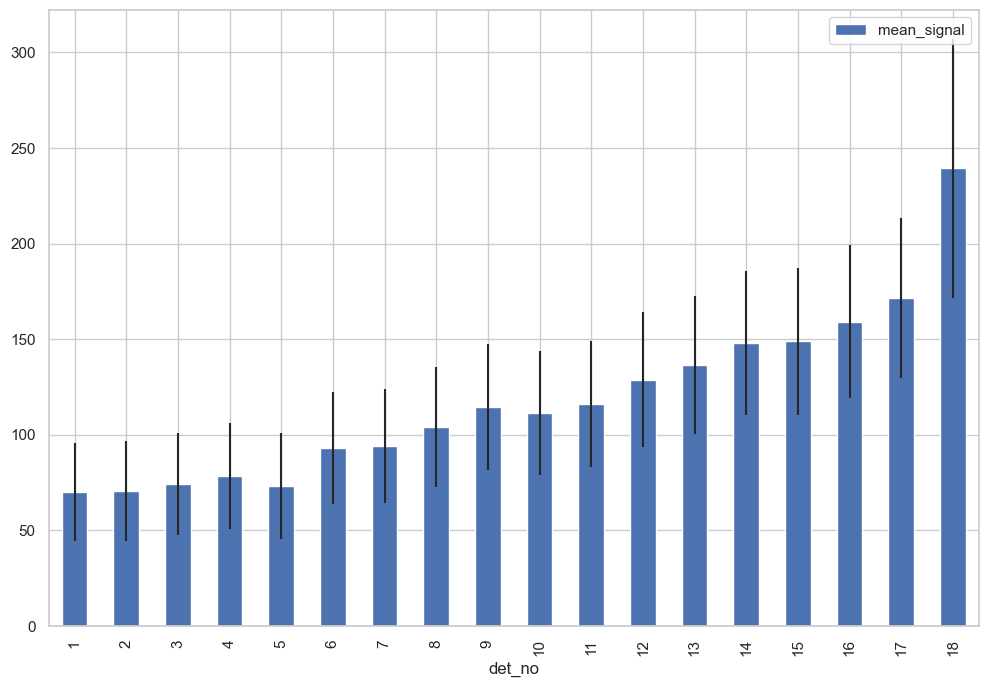

In [87]:
df[df.radiation == 'proton'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

<Axes: xlabel='det_no'>

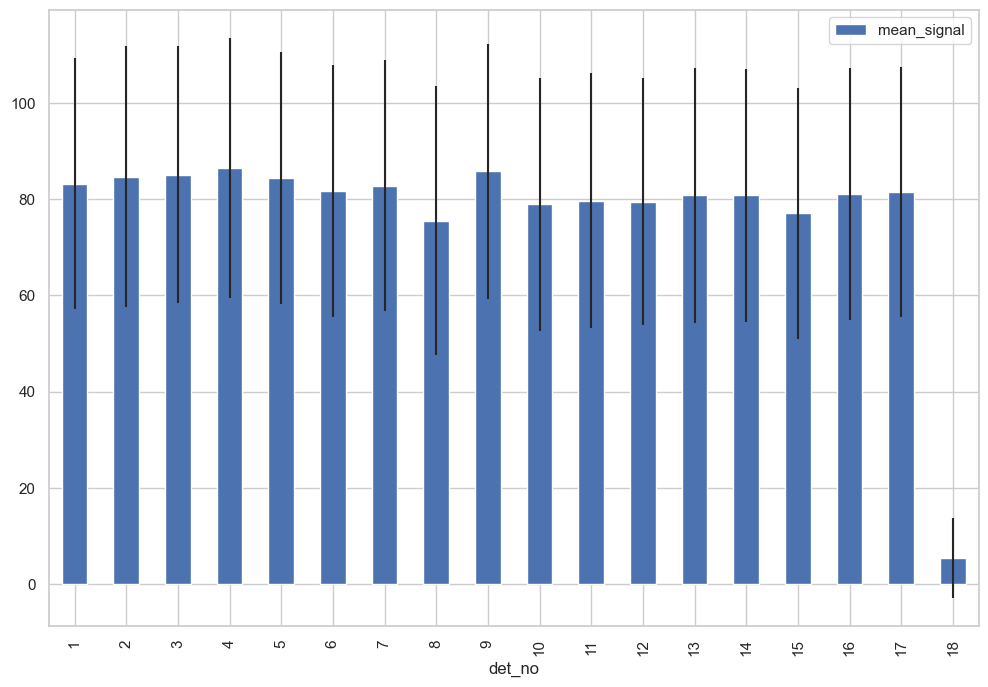

In [88]:
df[df.radiation == 'Co60'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

# Good dataset selection

In [89]:
det_data_dict = {}
for data in proton_det_cut_data.data.values():
    if data.det_no <= 19:
        det_data_dict[data.det_no] = data
        print(f"{data.det_no} ", end='')
proton_det_sel_data = DetectorDataCollection(path=proton_det_cut_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [90]:
det_data_dict = {}
for data in co60_det_cut_data.data.values():
    if data.det_no <= 19:
        det_data_dict[data.det_no] = data
        print(f"{data.det_no} ", end='')
co60_det_sel_data = DetectorDataCollection(path=co60_det_cut_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [91]:
import random
import math
num_circles = 1000
small_radius = 10
shift_x, shift_y = [], []
min_radius_all = 60
for _ in range(num_circles):
    angle = random.uniform(0, 2*np.pi)
    distance = random.uniform(0, 0.8*min_radius_all-small_radius)
    shift_x.append(distance * math.cos(angle))
    shift_y.append(distance * math.sin(angle))

In [92]:
df_data = defaultdict(list)
for data in proton_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["proton"]
        df_data["circle_no"] += [circle_no]
for data in co60_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["Co60"]
        df_data["circle_no"] += [circle_no]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation,circle_no
18000,1,81.091195,25.427066,Co60,0
18001,1,82.529968,26.405774,Co60,1
18002,1,83.920886,27.023140,Co60,2
18003,1,82.619048,26.932148,Co60,3
18004,1,82.932692,25.610719,Co60,4
...,...,...,...,...,...
17995,18,29.259615,21.293731,proton,995
17996,18,11.805031,13.035982,proton,996
17997,18,17.227564,15.749933,proton,997
17998,18,16.050633,14.261925,proton,998


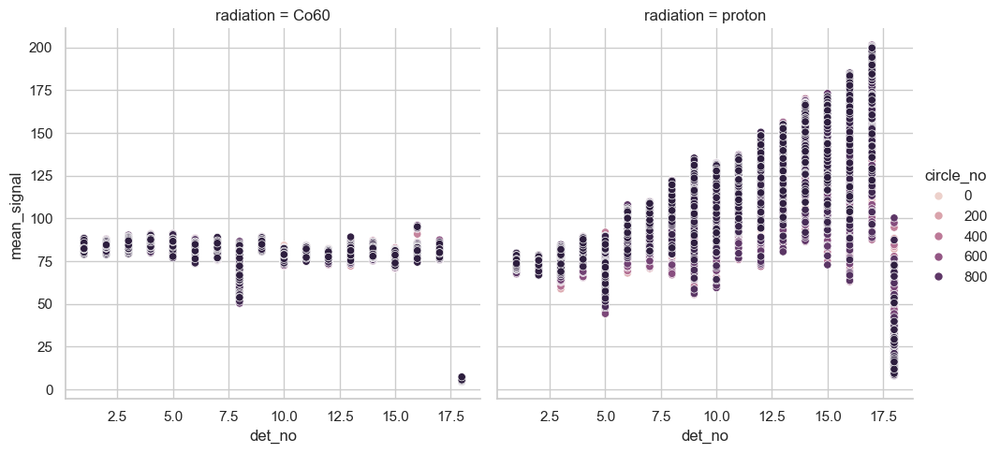

In [93]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.relplot(x="det_no", y="mean_signal", hue="circle_no", col="radiation", data=df)

In [94]:
df2 = pd.DataFrame()
df2["mean"] = df.groupby(["radiation", "det_no"])["mean_signal"].mean()
df2["std"] = df.groupby(["radiation", "det_no"])["mean_signal"].std()
df2

mean        std
radiation det_no                       
Co60      1        83.824452   1.903466
          2        84.249438   1.478100
          3        85.107729   2.399810
          4        86.491055   2.201645
          5        84.977943   2.376708
          6        81.383114   2.307891
          7        82.567876   2.677266
          8        76.305738   9.391403
          9        85.223569   1.590584
          10       78.830512   1.811209
          11       79.389846   2.042538
          12       79.451727   1.595187
          13       81.030344   2.593637
          14       80.287139   2.348115
          15       77.160063   2.301591
          16       81.301845   2.886143
          17       81.147445   1.971329
          18        5.433894   0.393033
proton    1        75.390267   2.340467
          2        74.558735   2.085833
          3        77.405837   3.977132
          4        83.314926   3.924848
          5        69.357364   8.995399
          6        95.808612   6.717133
          7       100.180247   7.459077
          8       109.690233  10.687577
          9       119.496300  15.656712
          10      120.289781  14.449843
          11      124.974972  11.241082
          12      134.722452  15.089489
          13      142.431324  15.657994
          14      151.909514  16.621156
          15      151.560248  20.247061
          16      157.613037  26.547269
          17      178.059828  23.630994
          18       18.514460  15.182875

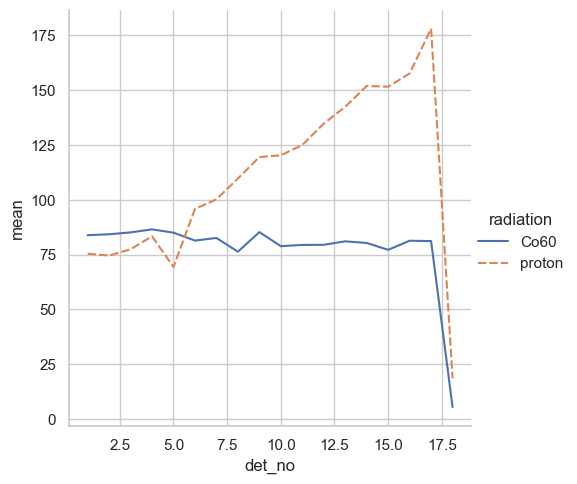

In [95]:
sns.relplot(data=df2.reset_index(), x='det_no', y='mean', hue='radiation', style='radiation', kind='line')

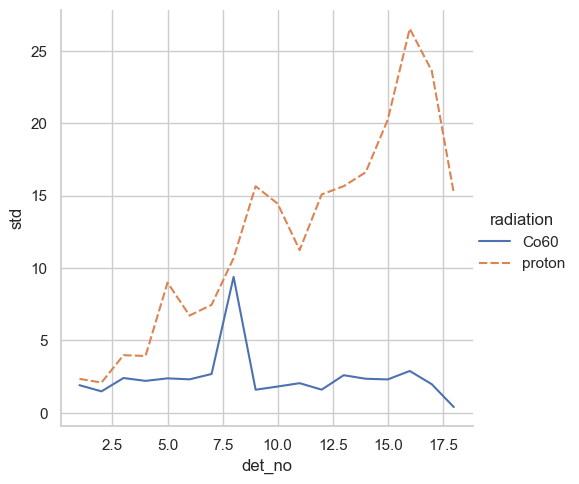

In [96]:
sns.relplot(data=df2.reset_index(), x='det_no', y='std', hue='radiation', style='radiation', kind='line')

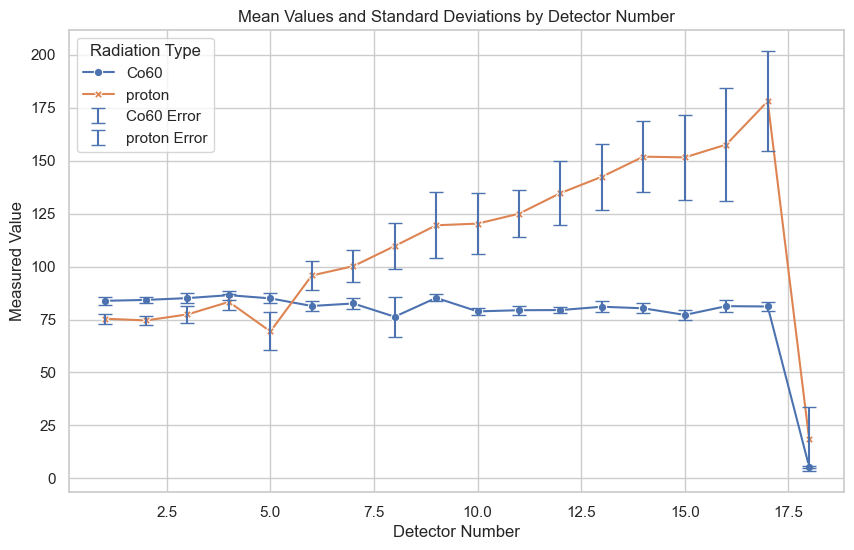

In [97]:
# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points
sns.lineplot(data=df2_reset, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars
for radiation_type in df2_reset['radiation'].unique():
    subset = df2_reset[df2_reset['radiation'] == radiation_type]
    plt.errorbar(subset['det_no'], subset['mean'], yerr=subset['std'], fmt='none', capsize=5, label=f'{radiation_type} Error')

plt.title('Mean Values and Standard Deviations by Detector Number')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

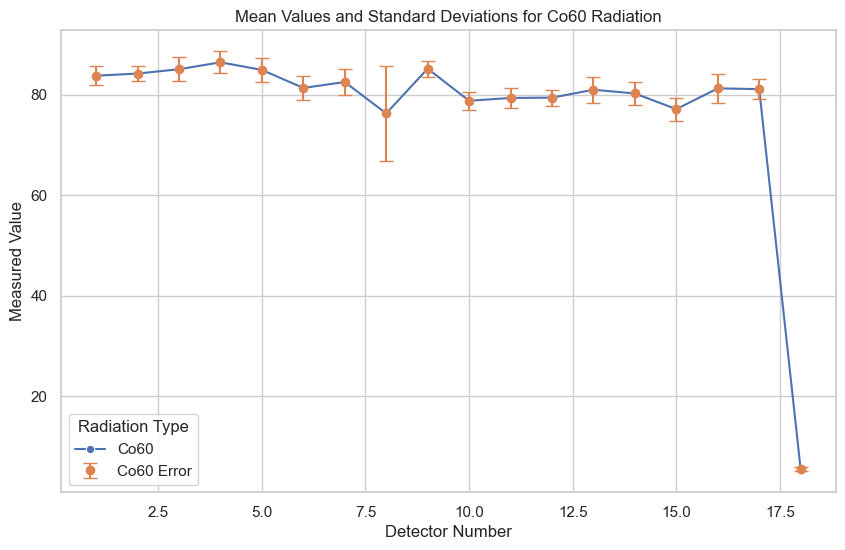

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df2 is already defined and includes 'mean' and 'std' columns for each 'det_no' for different 'radiation' conditions.

# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()

# Filter the data for 'Co60' radiation
df2_co60 = df2_reset[df2_reset['radiation'] == 'Co60']

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points for Co60
sns.lineplot(data=df2_co60, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars for Co60
plt.errorbar(df2_co60['det_no'], df2_co60['mean'], yerr=df2_co60['std'], fmt='o', capsize=5, label='Co60 Error')

plt.title('Mean Values and Standard Deviations for Co60 Radiation')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

In [100]:
path_interim = project_dir / 'data' / 'interim'
path_interim.mkdir(parents=True, exist_ok=True)
df.to_hdf(path_interim / 'data.h5', key='df', mode='w')